In [1]:
# import system libraries
import logging
import sys, copy
# import scientific libraries
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.signal
from scipy.interpolate import InterpolatedUnivariateSpline as spline
import h5py
import pandas as pd
# import data analysis libraries
from ldc.waveform.lisabeta import FastBHB
import lisabeta.lisa.lisa as lisa
from lisabeta.lisa.lisa import EvaluateTDIFreqseries
import lisabeta.tools.pyspline as pyspline
import lisabeta.lisa.lisatools as lisatools
import lisabeta.tools.pytools as pytools
from ldc.common import tools
from ldc.lisa.noise import AnalyticNoise, get_noise_model
from chainconsumer import Chain, ChainConsumer, make_sample, Truth
import lisaconstants
# import sampler libraries
from eryn.ensemble import EnsembleSampler
from eryn.state import State
from eryn.prior import uniform_dist, ProbDistContainer
from ldc.waveform.waveform import HpHc

mpl.rcParams.update(mpl.rcParamsDefault)

Could not import fastgb. Please pip install fastgb


# Set up injection and find noiseless Afull and Efull. Set up Npsd, timing, and frequencies

In [2]:
#imports all dependencies and homebrewed functions
import LISA_TTL_Functions as foc

In [3]:
#set up the injection

pMBHB_ldc = {'EclipticLatitude': -0.30300442294174235,
 'EclipticLongitude': 1.2925183861048521,
 'PolarAngleOfSpin1': 1.2031361791056812,
 'PolarAngleOfSpin2': 2.097303543065685,
 'Spin1': 0.747377,
 'Spin2': 0.8388,
 'Mass1': 1323277.47932, #original 1323277.47932
 'Mass2': 612485.5060299999, #original 612485.5060299999
 'CoalescenceTime': 11526944.921879262,
 'PhaseAtCoalescence': 1.2201968860015653,
 'InitialPolarAngleL': 2.6919824500032945,
 'InitialAzimuthalAngleL': 1.808398497592109,
 'Redshift': 1.73941,
 'Distance': 13470.983559 , #13470.983559 original
 'ObservationDuration': 31558149.763545603,
 'Cadence': 3.0}

snr = 22295 for distance 1347.983559 \
snr = 223 for distance 134700 \
snr = 12021 for distance 2500 \
snr = 2230 for distance 13470 \
snr = 7026 for mass x10 distance 2500 \
snr = 1303 for mass x10 distance 13470 \
snr = 130 for mass x10 distance 134700 \
snr = 2096 for mass x.1 distance 2500 \
snr = 389 for mass x0.1 distance 13470 \
snr = 38 for mass x0.1 distance 134700

In [40]:
snr_unrounded = foc.snr_check(pMBHB_ldc)
snr = int(snr_unrounded)
difference = 'Robbie_fixed'
print(snr)

2230.9845934810273
2230


In [5]:
#establish t_min, max, separation and number of samples
t_min = 0
t_max = pMBHB_ldc["CoalescenceTime"]+1000
dt = 0.25
df = 1/t_max

t = np.arange(t_min, t_max, dt)

In [6]:
#set up the injection in lisabeta terms
FBH = FastBHB("MBHB", T=t_max, delta_t=dt, approx="IMRPhenomHM")

pMBHB = FBH.rename_as_lisabeta(pMBHB_ldc)

print(pMBHB.keys())
pMBHB['psi'] += np.pi
pMBHB['phi'] -= np.pi

dict_keys(['beta', 'lambda', 'chi1', 'chi2', 'm1', 'm2', 'Deltat', 'phi', 'dist', 'psi', 'inc'])


In [7]:
#background settings
waveform_params_smbh = {
    "minf": 1e-5,
    "maxf": 1,
    "t0": 0.0,
    "timetomerger_max": 1.0,
    "tmax": 1.0,
    "TDI": "TDI2AET",
    "LISAconst": "Proposal",
    "responseapprox": "full",
    "frozenLISA": False,
    "TDIrescaled": False,
    "modes": None,
    # Waveform approximant and set of harmonics to use 
    "approximant": "IMRPhenomHM"
}

# generate splined afull

In [8]:
#generate interpolated signal
tdisignal = lisa.GenerateLISATDISignal_SMBH(pMBHB, **waveform_params_smbh)
tdi = tdisignal['tdi']
mbh_lb_2 = tdi[(2,2)]

In [9]:
#Fvec for interpolation
fmin = mbh_lb_2['freq'][0]
fmax = mbh_lb_2['freq'][-1]
ndata = int(t_max/dt)
df = 1/t_max

# Get the full frequencies
if (ndata % 2)==0:              # Get the number of requencies
    nfft = int((ndata/2)+1)
else:
    nfft = int((ndata+1)/2)

F = df*nfft                 # make the positive frequency vector
fvec = np.arange(0, F, df)

# Get the frequencies of interest
f_inds = np.where(np.logical_and(fvec >= fmin, fvec < fmax))
fvec = fvec[f_inds]
fvec = fvec[fvec>0]
print(fvec)

[4.86643546e-05 4.87511004e-05 4.88378461e-05 ... 2.09760718e-02
 2.09761585e-02 2.09762453e-02]


In [10]:
#downsample fvec so it cant get too small
stride = 80 # 3016 bins

if len(fvec) != 3016:
    fvec_coarse = fvec[::stride]  
    print(len(fvec_coarse))
    fvec = np.ascontiguousarray(fvec_coarse)
else:
    pass

3016


# construct splined afull on fvec grid

In [11]:
#generate data
modesf  = tdisignal['tdi']['modes']

print(modesf)
A_full = np.zeros(len(fvec), dtype=complex)
E_full = np.zeros(len(fvec), dtype=complex)

for i in range(len(modesf)):
    mbh_lb = tdi[modesf[i]]

    mask = (fvec >= mbh_lb['freq'].min()) & (fvec <= mbh_lb['freq'].max())
    
    #phase
    splPh = spline(mbh_lb['freq'], mbh_lb['phase'], ext='raise')
    #A
    splAr = spline(mbh_lb['freq'], mbh_lb['amp_real_chan1'])
    splAi = spline(mbh_lb['freq'], mbh_lb['amp_imag_chan1'])
    #E
    splEr = spline(mbh_lb['freq'], mbh_lb['amp_real_chan2'])
    splEi = spline(mbh_lb['freq'], mbh_lb['amp_imag_chan2'])

    A_full[mask] += np.conjugate((splAr(fvec[mask]) + 1.j*splAi(fvec[mask])) * np.exp(1j*splPh(fvec[mask])))
    E_full[mask] += np.conjugate((splEr(fvec[mask]) + 1.j*splEi(fvec[mask])) * np.exp(1j*splPh(fvec[mask])))

Nmodel = AnalyticNoise(fvec, model="SciRDv1") # or whatever version you prefer. In the previous notebook we used "sangria"
Npsd = Nmodel.psd(option='A', tdi2=True)

# constructing signal at each Fouriner freq.

[(2, 2), (2, 1), (3, 3), (3, 2), (4, 4), (4, 3)]


In [12]:
Afull = A_full
Efull = E_full

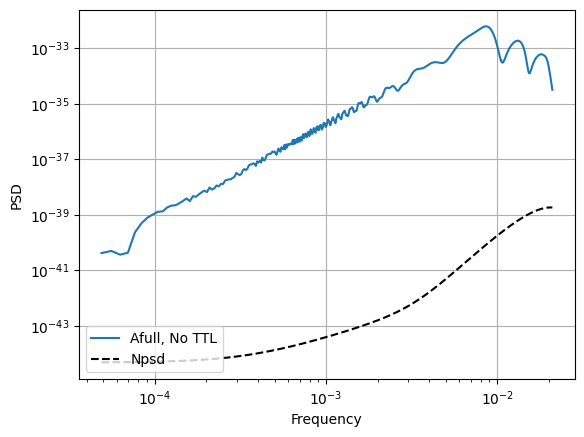

In [13]:
fig, ax = plt.subplots()
ax.loglog(fvec, np.abs(Afull)**2, label = 'Afull, No TTL')
ax.loglog(fvec, Npsd, '--', color = 'k', label = 'Npsd')
ax.set_xlabel('Frequency')
ax.set_ylabel('PSD')
ax.legend(loc = 'lower left')
ax.grid()

# Check generation with custom grid fvec

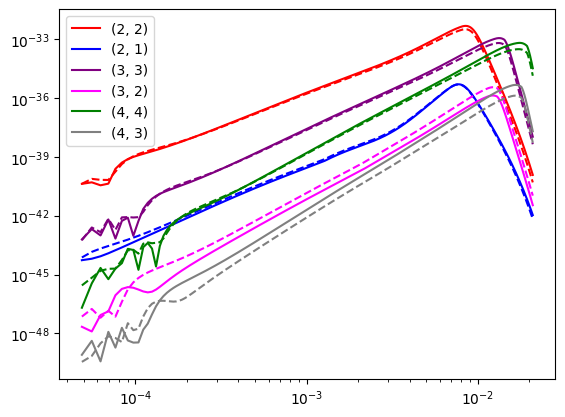

In [14]:

tdisignal_check = lisa.GenerateLISATDISignal_SMBH(pMBHB, gridfreq=fvec, 
                                                  scale_freq_hm=False,  #REQUIRED
                                                  **waveform_params_smbh)
modes = tdisignal['tdi']['modes']
colors = ['red', 'blue', 'purple', 'magenta', 'green', 'gray']


A_trial = np.zeros(len(fvec), dtype=complex)
E_trial = np.zeros(len(fvec), dtype=complex)

for i in range(len(modes)):
    mbh_lb = tdisignal_check['tdi'][modes[i]]

    A_partial = np.conjugate((mbh_lb['amp_real_chan1'] + 1.j*mbh_lb['amp_imag_chan1']) * np.exp(1j*mbh_lb['phase']))
    E_partial = np.conjugate((mbh_lb['amp_real_chan2'] + 1.j*mbh_lb['amp_imag_chan2']) * np.exp(1j*mbh_lb['phase']))

    plt.loglog(fvec, np.abs(A_partial)**2, label = str(modesf[i]), color = colors[i])
    plt.loglog(fvec, np.abs(E_partial)**2, '--', color = colors[i])
    plt.legend()

    A_trial += A_partial
    E_trial += E_partial


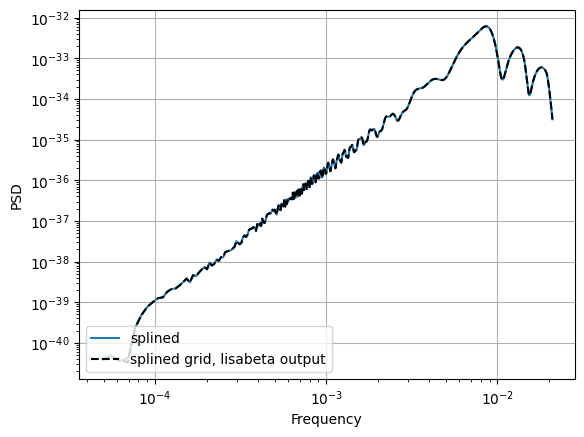

In [15]:
fig, ax = plt.subplots()
ax.loglog(fvec, np.abs(Afull)**2, label = 'splined')
ax.loglog(fvec, np.abs(A_trial)**2,'--', color = 'k', label = 'splined grid, lisabeta output')

ax.set_xlabel('Frequency')
ax.set_ylabel('PSD')
ax.legend(loc = 'lower left')
ax.grid()

# Set up the MCMC: array for trials, likelihood, priors, initial condition, temps, walkers, samples, etc

In [ ]:
#now we set things up for mcmc
#solving for chirpmass and ratio
m1 = pMBHB['m1']
m2 = pMBHB['m2']
q = m1/m2
Mc = (m1+m2)*(q/(1+q)**2)**0.6

src0 = pMBHB.copy()
#src0.pop("m1"); src0.pop("m2")
del src0['m2']
del src0['m1']
src0["Mchirp"] = Mc
src0["q"] = q
print(src0['psi'])
print(src0['phi'])
#src0['psi'] += np.pi #I def switched the - and + for no solid reason
#src0['phi'] -= np.pi

keys = src0.keys()

#create the array to be altered in likelihood
src = copy.deepcopy(src0)

1.2912226019238924
-1.9213957675882278
1.2912226019238924
-1.9213957675882278


In [17]:
print(pMBHB.keys())
print(src.keys())

dict_keys(['beta', 'lambda', 'chi1', 'chi2', 'm1', 'm2', 'Deltat', 'phi', 'dist', 'psi', 'inc'])
dict_keys(['beta', 'lambda', 'chi1', 'chi2', 'Deltat', 'phi', 'dist', 'psi', 'inc', 'Mchirp', 'q'])


In [26]:
#claude slightly edit mask
def likelihood(params):

    src = {k: v for k, v in zip(keys, params)}

    tdisignal_likelihood = lisa.GenerateLISATDISignal_SMBH(src, 
                                                gridfreq=fvec,
                                                scale_freq_hm=False,
                                                 **waveform_params_smbh)
    
    modes = tdisignal_likelihood['tdi']['modes']

    A_trial = np.zeros(len(fvec), dtype=complex)
    E_trial = np.zeros(len(fvec), dtype=complex)

    for i in range(len(modes)):
        mbh_lb = tdisignal_likelihood['tdi'][modes[i]]

        A_partial = np.conjugate((mbh_lb['amp_real_chan1'] + 1.j*mbh_lb['amp_imag_chan1']) * np.exp(1j*mbh_lb['phase']))
        E_partial = np.conjugate((mbh_lb['amp_real_chan2'] + 1.j*mbh_lb['amp_imag_chan2']) * np.exp(1j*mbh_lb['phase']))
        
        A_trial += A_partial
        E_trial += E_partial

    SN_m = 4.0*df*np.sum(np.real(Afull*np.conjugate(A_trial))/Npsd) + 4.0*df*np.sum(np.real(Efull*np.conjugate(E_trial))/Npsd)
    XX = 4.0*df*np.sum(np.abs(A_trial)**2/Npsd) + 4.0*df*np.sum(np.abs(E_trial)**2/Npsd)

    likelihoodc = SN_m - 0.5*XX
    return likelihoodc #, A_trial

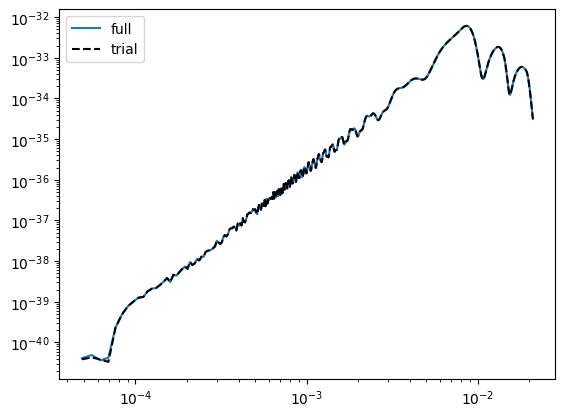

In [19]:

lik, atrial= likelihood(list(src0.values()))
plt.loglog(fvec, np.abs(A_full)**2, label = 'full') 
plt.loglog(fvec, np.abs(A_trial)**2, '--', color = 'k', label = 'trial')
plt.legend()


In [20]:
print(src0)
#phi starting out of bounds
#psi out of bounds

{'beta': -0.30300442294174235, 'lambda': 1.2925183861048521, 'chi1': np.float64(0.26863190922667673), 'chi2': np.float64(-0.4215109787709388), 'Deltat': 11526944.921879262, 'phi': -1.9213957675882278, 'dist': 13470.983559, 'psi': np.float64(1.2912226019238924), 'inc': np.float64(2.2517895222056112), 'Mchirp': 772462.8571528315, 'q': 2.160504152820206}


In [21]:
day_sec = 86400

priors = {"mbh": ProbDistContainer({
    0: uniform_dist(-np.pi/2, np.pi/2), #lambda
    1: uniform_dist(-np.pi, np.pi), #beta
    2: uniform_dist(-1, 1), #chi1
    3: uniform_dist(-1, 1), #chi2
    4: uniform_dist(100*day_sec, 175*day_sec), #deltat
    5: uniform_dist(-np.pi, np.pi), #phi
    6: uniform_dist(500.0, 2000000.0), #dist 
    7: uniform_dist(0., np.pi), #psi
    8: uniform_dist(0., np.pi), #inc
    9: uniform_dist(1e4, 1e7), #mchirp 
    10: uniform_dist(1, 10), #q
})}

ndims = {"mbh": 11}
df = fvec[1]-fvec[0]

In [29]:
ntemps = 5
nwalkers = 22
nsamples = 6000
ndims = {"mbh": 11}

In [30]:
theta0 = np.array([[np.hstack(
          (np.random.randn(ndims["mbh"]) * 1e-8) + np.array(list(src0.values())))
          for i in range(nwalkers)]
          for _ in range(ntemps)])
#keys = src0.keys()

start_state = State({"mbh": theta0})

In [31]:

sampler = EnsembleSampler(
    nwalkers,
    ndims,
    likelihood,
    priors,
    args=(),
    branch_names=["mbh"],
    tempering_kwargs=dict(ntemps=ntemps, Tmax=np.inf),
    nleaves_max=dict(mbh=1),
    #pool=pool,
)

# Run the MCMC

In [32]:
sampler.run_mcmc(start_state, nsamples, progress=True, store = True)

100%|██████████| 6000/6000 [4:56:46<00:00,  2.97s/it]  


# Plot corner and walkers

In [33]:
#define truths
keys = src0.keys()
labels = list(keys)

inj=np.array(list(src0.values()))

truths = inj.flatten()
labels_final = labels

In [34]:
truth = pd.DataFrame(data = truths , columns = ['truths'])
csv_filename_truth = str(snr) + difference + "_snr_truth.csv"
truth.to_csv(csv_filename_truth, index=False)

In [37]:
burn = 20000

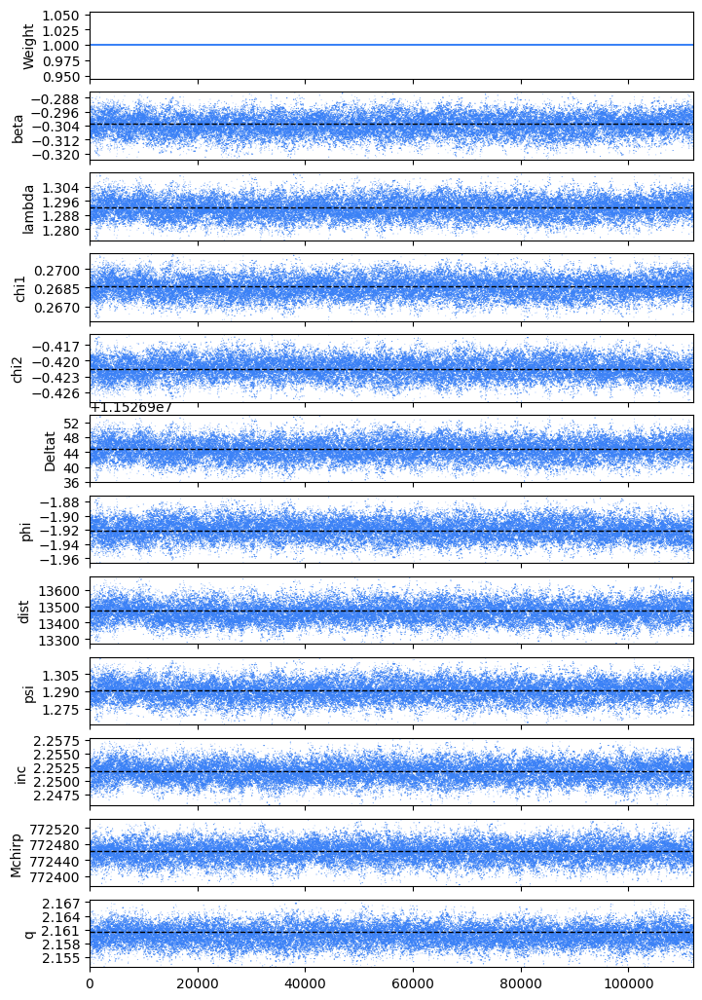

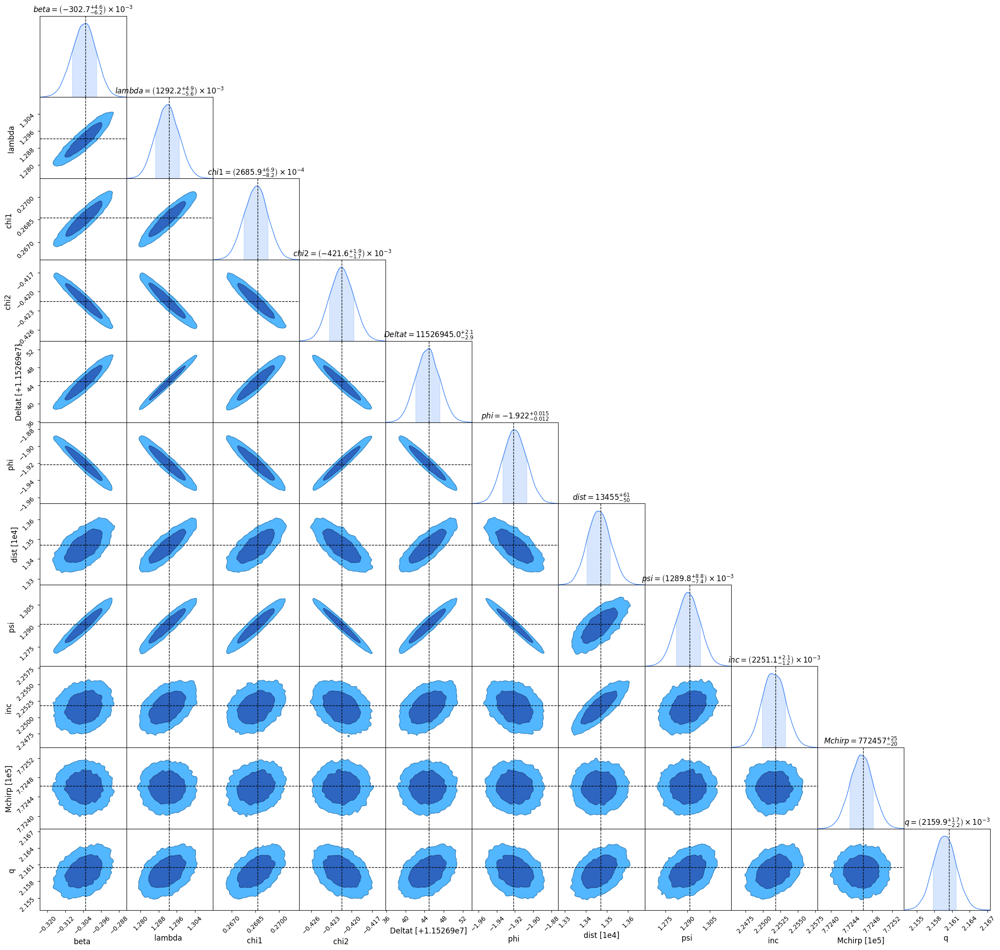

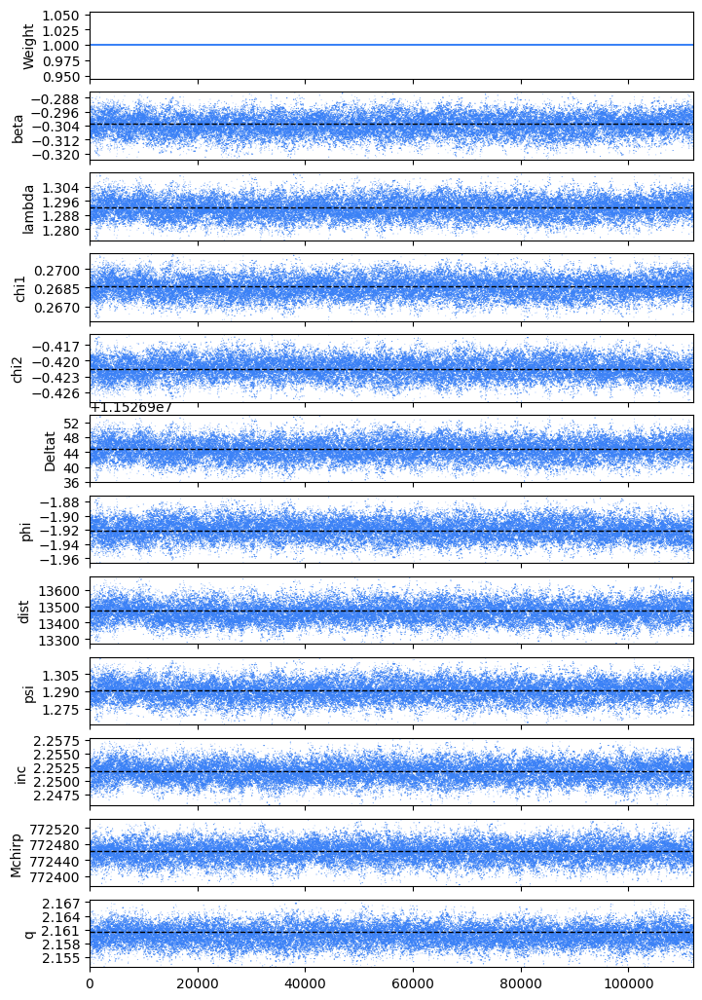

In [38]:
c = ChainConsumer()

samples_2ch = sampler.get_chain()["mbh"][:, 0].reshape(-1, 11)

dfs_2chnls = pd.DataFrame(samples_2ch[burn:, :], columns = keys)

c.add_chain(Chain(samples=dfs_2chnls, name="noiseless", color="blue"))
c.add_truth(Truth(location={k:v for (k,v) in zip(labels_final,truths)}))

c.plotter.plot()
c.plotter.plot_walks()

In [42]:
csv_filename_0mm = "0mm_" + difference + "_all_modes_chains.csv"
dfs_2chnls.to_csv(csv_filename_0mm, index=False)
print(f"Chain data saved to {csv_filename_0mm}")

Chain data saved to 0mm_Robbie_fixed_all_modes_chains.csv


In [61]:
truth = pd.DataFrame(data = truths , columns = ['truths'])
csv_filename_truth = difference + "_truth.csv"
truth.to_csv(csv_filename_truth, index=False)
print(f"Chain data saved to {csv_filename_truth}")

Chain data saved to Robbie_fixed_truth.csv


# Add 1mm noise to the waveform

In [43]:
#a constant
fstar = 0.0190854 #c/L/(2*np.pi)
#generate noise psd for 1mm
psd_sqrt = (6e-11*(np.sin(2*fvec/fstar)**2) + 1e-12)/2.5e9 #2.5e9 is armlength
#1mm eyeball -> 6e-11
#2mm eyeball -> 2e-10
#10mm eyeball -> 8e-10
psd = ((6e-11*(np.sin(2*fvec/fstar)**2) + 1e-12)/2.5e9)**2/(df*4)

#Add noise function
def randc(r):
    return r/np.sqrt(2)*(np.random.randn(*r.shape) + 1j*np.random.randn(*r.shape))

#create noise fft
noise_fft = randc(psd_sqrt)

In [44]:
#add noisy noise to signal
Afull = A_full+ noise_fft/np.sqrt(df*4)
Efull = E_full+ noise_fft/np.sqrt(df*4)

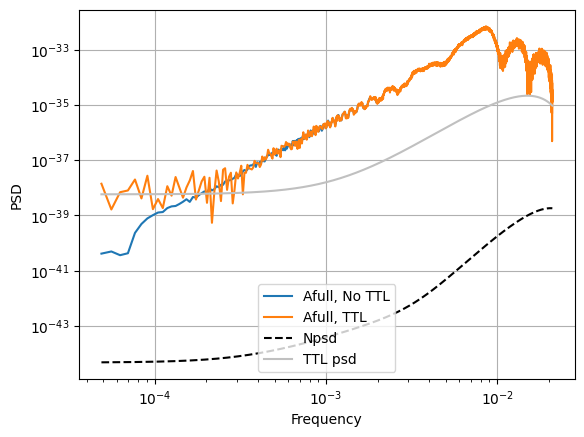

In [45]:
fig1, ax1 = plt.subplots()
ax1.loglog(fvec, np.abs(A_full)**2, label = 'Afull, No TTL')
ax1.loglog(fvec, np.abs(Afull)**2, label = 'Afull, TTL')
ax1.loglog(fvec, Npsd, '--', color = 'k', label = 'Npsd')
ax1.loglog(fvec, psd, color = 'silver' ,label = 'TTL psd')
ax1.set_xlabel('Frequency')
ax1.set_ylabel('PSD')
ax1.legend(loc = 'lower center')
ax1.grid()

# Rerun the same MCMC with 1mm

In [46]:
sampler2 = EnsembleSampler(
    nwalkers,
    ndims,
    likelihood,
    priors,
    args=(),
    branch_names=["mbh"],
    tempering_kwargs=dict(ntemps=ntemps),
    nleaves_max=dict(mbh=1),
)

In [47]:
sampler2.run_mcmc(start_state, nsamples, progress=True, store = True)

100%|██████████| 6000/6000 [5:28:50<00:00,  3.29s/it]  


# Plot walkers and corners 1mm

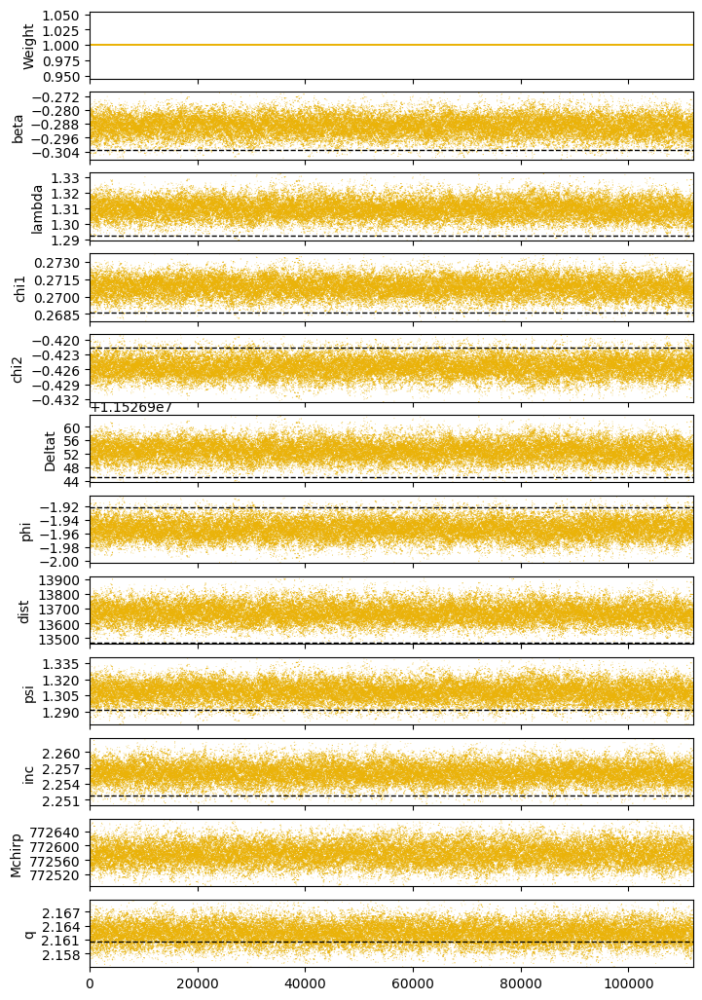

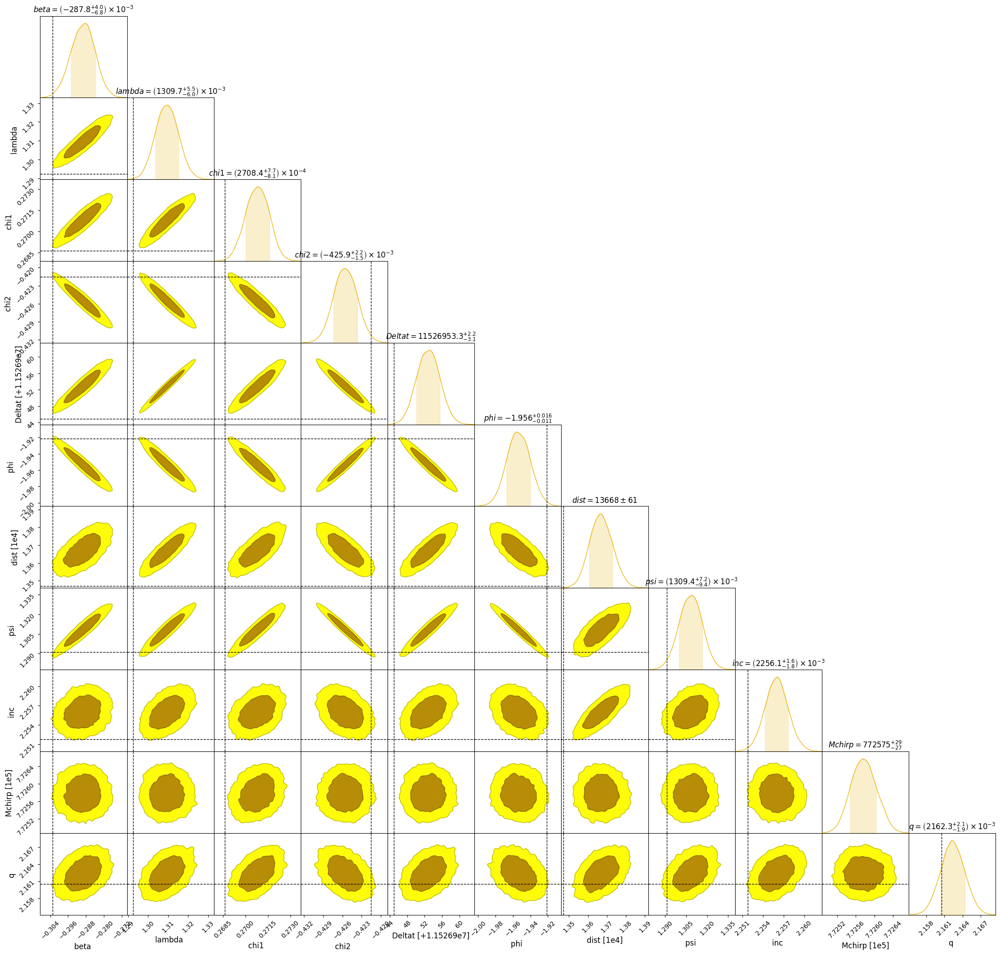

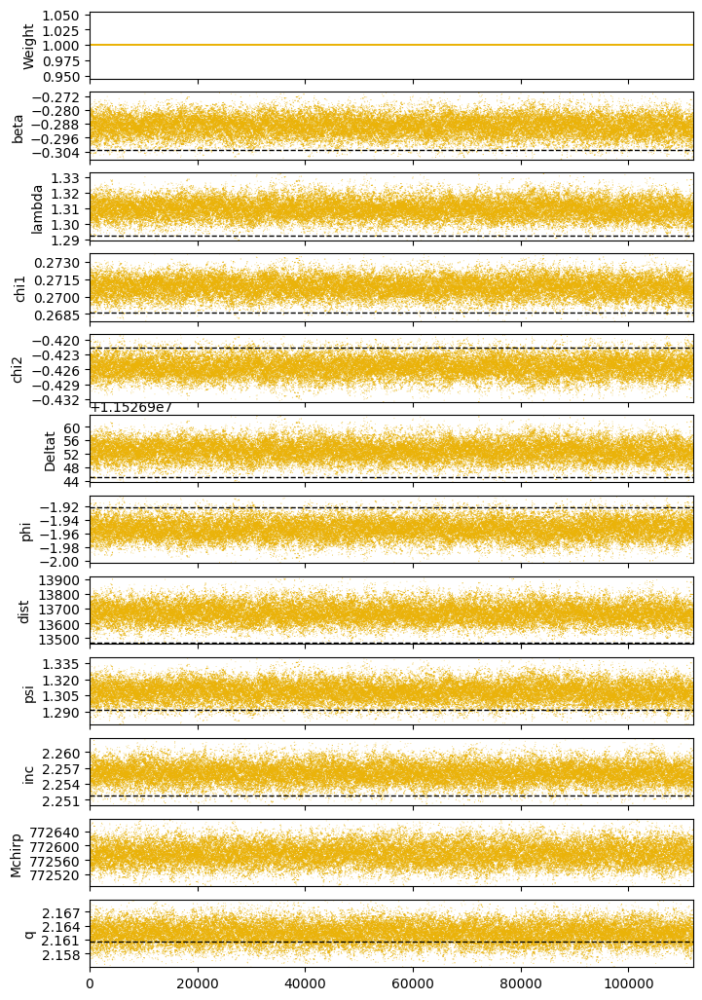

In [48]:
a = ChainConsumer()

one_samples = sampler2.get_chain()["mbh"][:, 0].reshape(-1, 11)

#burn = 30000
one_samp= pd.DataFrame(one_samples[burn:, :], columns = keys)

a.add_chain(Chain(samples=one_samp, name="1mm", color="yellow"))
a.add_truth(Truth(location={k:v for (k,v) in zip(labels_final,truths)}))

a.plotter.plot()
a.plotter.plot_walks()

In [49]:
csv_filename_1mm = "1mm_"+ difference + "_all_modes_chains.csv"
one_samp.to_csv(csv_filename_1mm, index=False)
print(f"Chain data saved to {csv_filename_1mm}")

Chain data saved to 1mm_Robbie_fixed_all_modes_chains.csv


# Add 1mm noise to the waveform

In [ ]:
#a constant
fstar = 0.0190854 #c/L/(2*np.pi)
#generate noise psd for 1mm
psd_sqrt = (2e-10*(np.sin(2*fvec/fstar)**2) + 1e-12)/2.5e9 #2.5e9 is armlength
#1mm eyeball -> 6e-11
#2.3mm eyeball -> 2e-10
#10mm eyeball -> 8e-10
psd = ((2e-10*(np.sin(2*fvec/fstar)**2) + 1e-12)/2.5e9)**2/(df*4)

#Add noise function
def randc(r):
    return r/np.sqrt(2)*(np.random.randn(*r.shape) + 1j*np.random.randn(*r.shape))

#create noise fft
noise_fft = randc(psd_sqrt)

In [51]:
#add noisy noise to signal
Afull = A_full+ noise_fft/np.sqrt(df*4)
Efull = E_full+ noise_fft/np.sqrt(df*4)

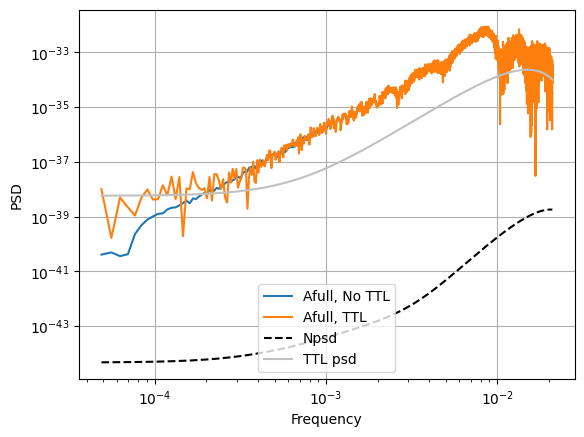

In [52]:
fig2, ax2 = plt.subplots()
ax2.loglog(fvec, np.abs(A_full)**2, label = 'Afull, No TTL')
ax2.loglog(fvec, np.abs(Afull)**2, label = 'Afull, TTL')
ax2.loglog(fvec, Npsd, '--', color = 'k', label = 'Npsd')
ax2.loglog(fvec, psd, color = 'silver' ,label = 'TTL psd')
ax2.set_xlabel('Frequency')
ax2.set_ylabel('PSD')
ax2.legend(loc = 'lower center')
ax2.grid()

# Rerun the same MCMC with 2.3mm

In [54]:
sampler3 = EnsembleSampler(
    nwalkers,
    ndims,
    likelihood,
    priors,
    args=(),
    branch_names=["mbh"],
    tempering_kwargs=dict(ntemps=ntemps),
    nleaves_max=dict(mbh=1),
)

In [55]:
sampler3.run_mcmc(start_state, nsamples, progress=True, store = True)

100%|██████████| 6000/6000 [5:26:35<00:00,  3.27s/it]  


# Plot walkers and corners 2.3mm

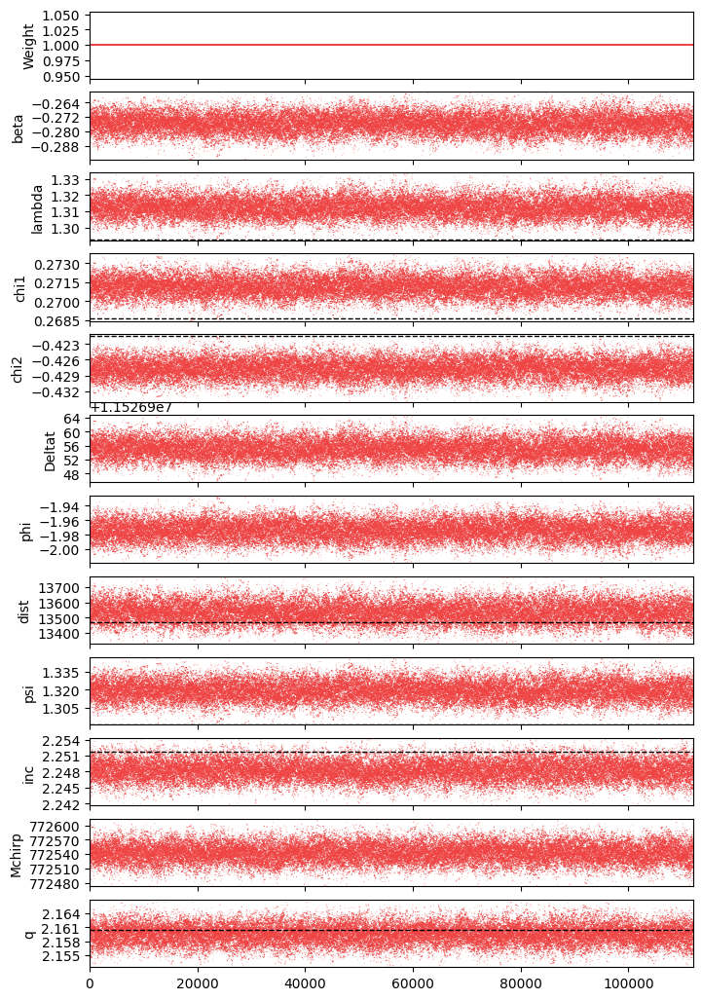

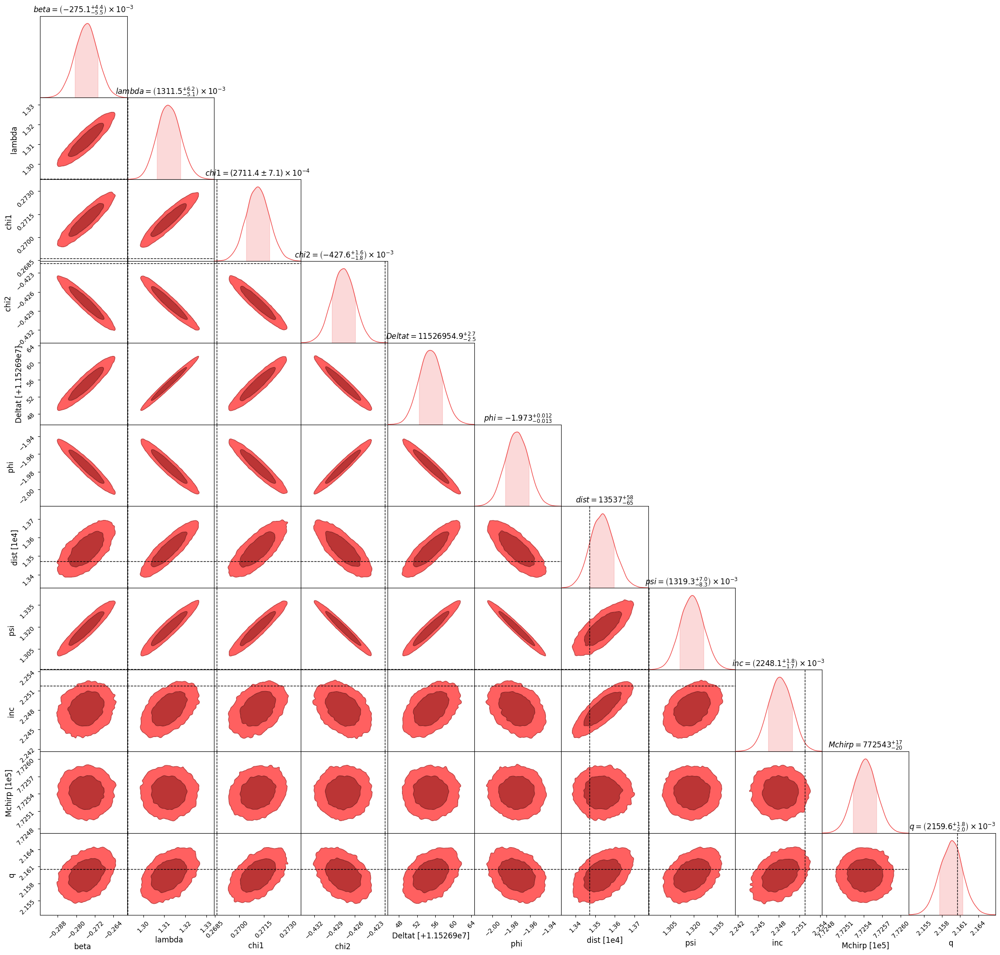

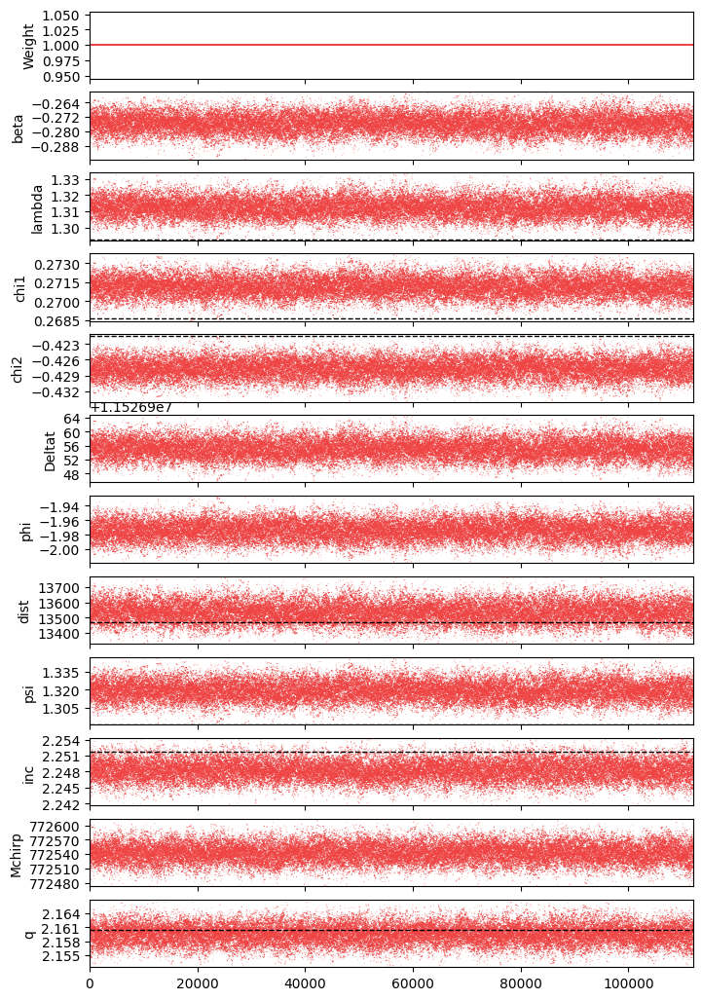

In [56]:
two_point_three = ChainConsumer()

two_three_samples = sampler3.get_chain()["mbh"][:, 0].reshape(-1, 11)

#burn = 30000
two_three_samp= pd.DataFrame(two_three_samples[burn:, :], columns = keys)

two_point_three.add_chain(Chain(samples=two_three_samp, name="2.3mm", color="red"))
two_point_three.add_truth(Truth(location={k:v for (k,v) in zip(labels_final,truths)}))

two_point_three.plotter.plot()
two_point_three.plotter.plot_walks()

In [62]:
csv_filename_2_3mm = "2_3mm_"+ difference + "_all_modes_chains.csv"
two_three_samp.to_csv(csv_filename_2_3mm, index=False)
print(f"Chain data saved to {csv_filename_2_3mm}")

Chain data saved to 2_3mm_Robbie_fixed_all_modes_chains.csv


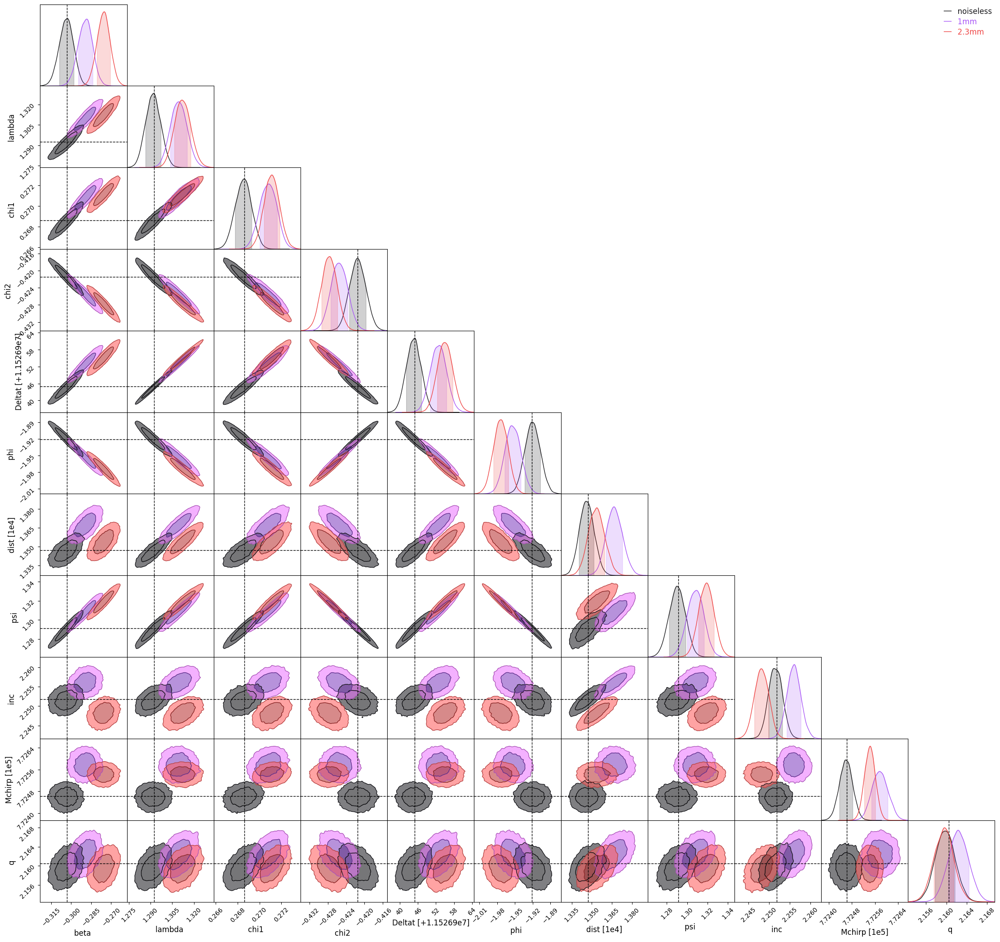

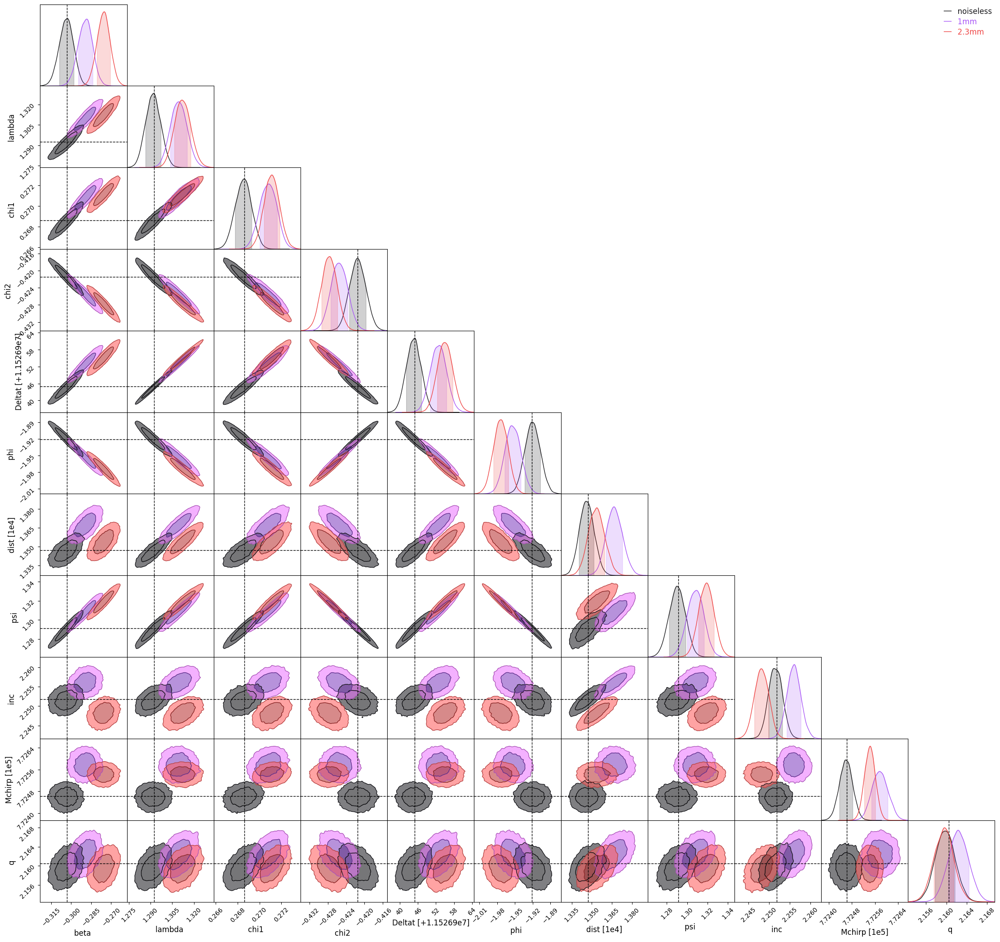

In [59]:
b = ChainConsumer()

b.add_chain(Chain(samples=dfs_2chnls, name="noiseless", color="black"))
b.add_chain(Chain(samples=one_samp, name="1mm", color="purple"))
b.add_chain(Chain(samples=two_three_samp, name="2.3mm", color="red"))
b.add_truth(Truth(location={k:v for (k,v) in zip(labels_final,truths)}))
b.plotter.plot()